<a href="https://colab.research.google.com/github/nerbivol/Methods-and-systems-of-artificial-intelligence/blob/main/image_processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow

In [ ]:
imgs = ['photo1', 'photo2','photo3']

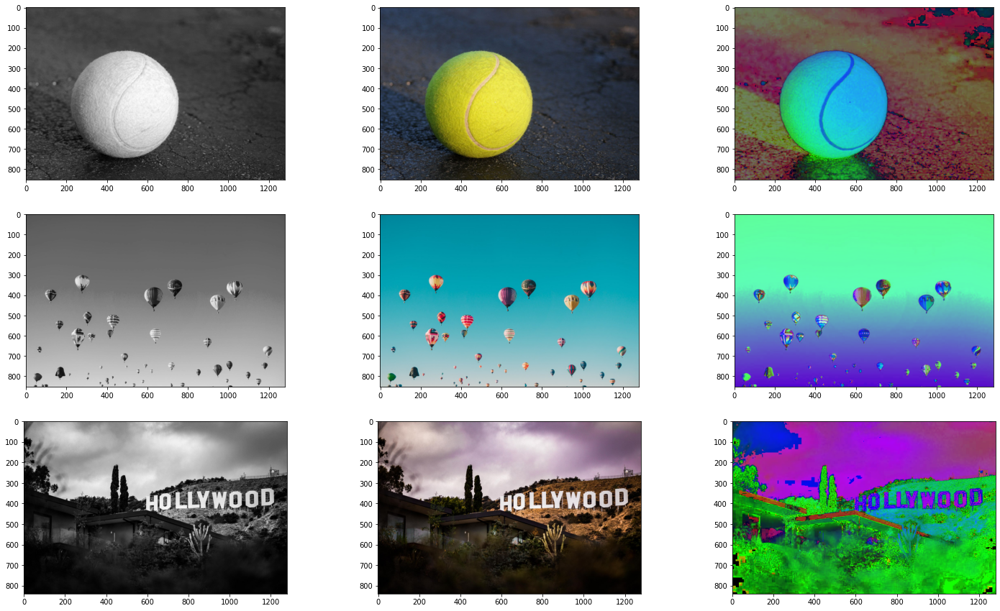

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(25, 15))
images_gray = {}
images_rgb = {}
images_hsv = {}

for i, img in enumerate(imgs):

  image = cv2.imread('/content/drive/My Drive/Colab Data/' + img + '.jpg')

  image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
  image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
  image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

  images_gray[img] = image_gray
  images_rgb[img] = image_rgb
  images_hsv[img] = image_hsv

  ax[i, 0].imshow(image_gray,cmap="gray")
  ax[i, 1].imshow(image_rgb)
  ax[i, 2].imshow(image_hsv)

Вивидемо гістограму зображення

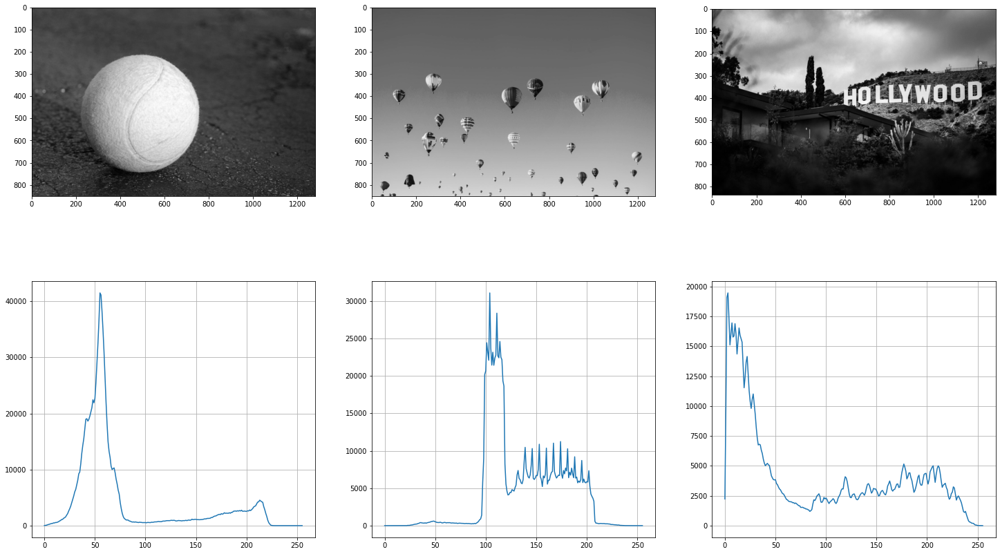

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(25, 15))

for i, img in enumerate(imgs):
  ax[0,i].imshow(images_gray[img],cmap="gray")
  hist = cv2.calcHist([images_gray[img]], [0], None, [256], [0, 256])
  ax[1,i].plot(hist)
  ax[1,i].grid()


Застосуємо вирівнювання гістограми

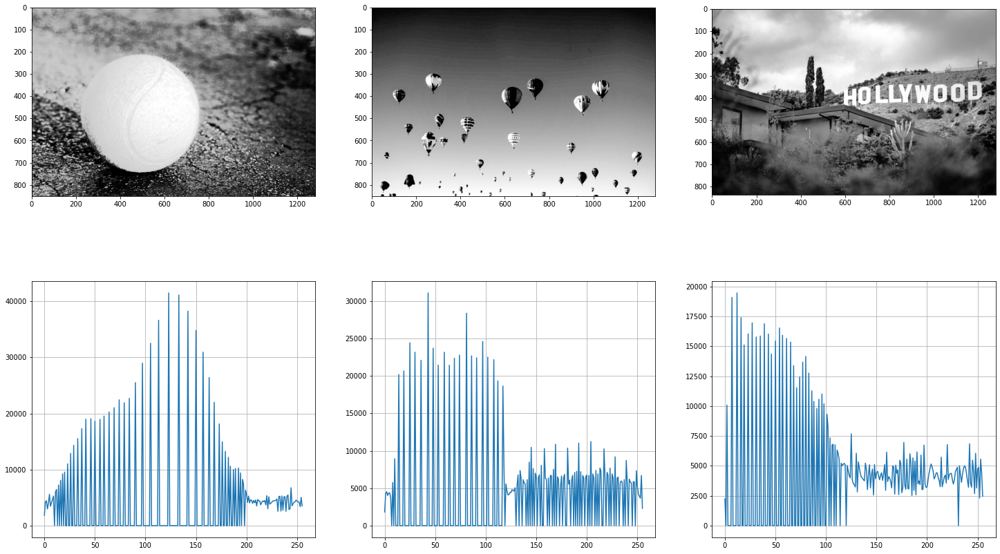

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(25, 15))

for i, img in enumerate(imgs):
  equ = cv2.equalizeHist(images_gray[img])
  ax[0,i].imshow(equ,cmap="gray")

  hist = cv2.calcHist([equ], [0], None, [256], [0, 256])
  ax[1,i].plot(hist)
  ax[1,i].grid()

Гістограма зображення це графічне представлення розподілу інтенсивності зображення. Тобто  визначає кількість пікселів для кожного значення інтенсивності. Вирівнювання гістограми покращує контрастність зображення, щоб розширити діапазон інтенсивності 

### Піраміда зображень

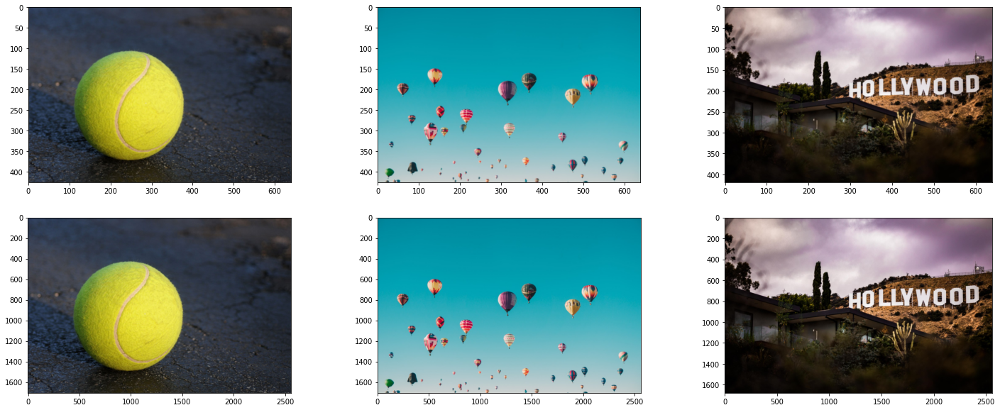

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(25, 10))

for i, img in enumerate(imgs):
  ax[0,i].imshow(cv2.pyrDown(images_rgb[img]))
  ax[1,i].imshow(cv2.pyrUp(images_rgb[img]))

### Гаусове згладжування

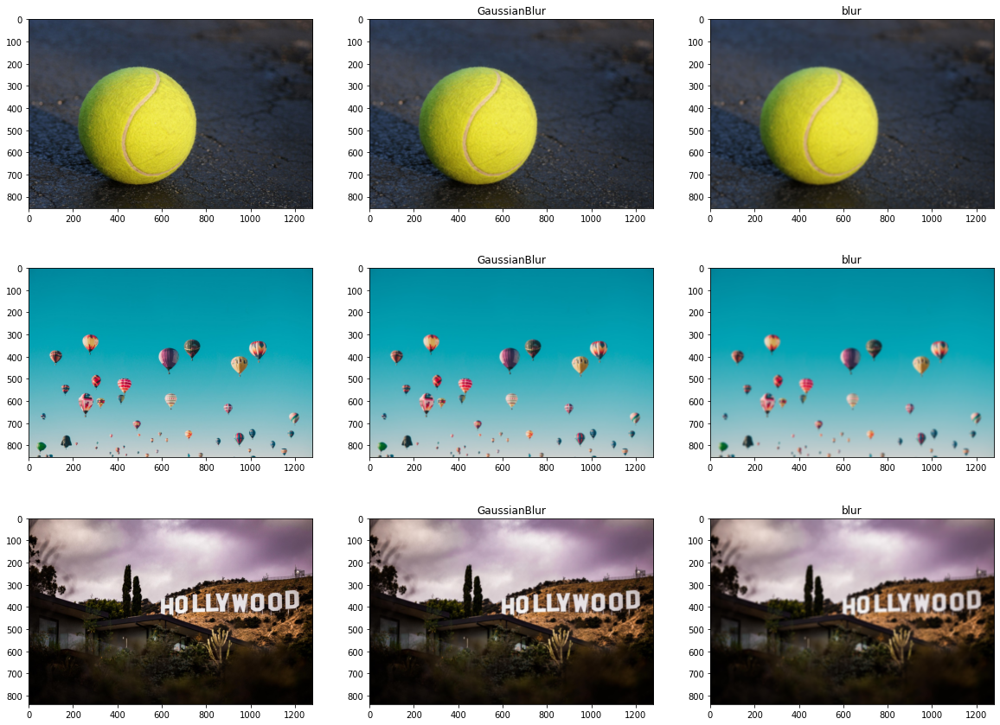

In [ ]:
fig, ax = plt.subplots(3, 3, figsize=(20, 15))

for i, img in enumerate(imgs):
  img_gaus_blur = cv2.GaussianBlur(images_rgb[img],(7,7),0)
  img_blur = cv2.blur(images_rgb[img], (10,10))

  ax[i, 0].imshow(images_rgb[img])

  ax[i, 1].imshow(img_gaus_blur)
  ax[i, 1].set(title = 'GaussianBlur')

  ax[i, 2].imshow(img_blur)
  ax[i, 2].set(title = 'blur')



### Порогова обробка зображень

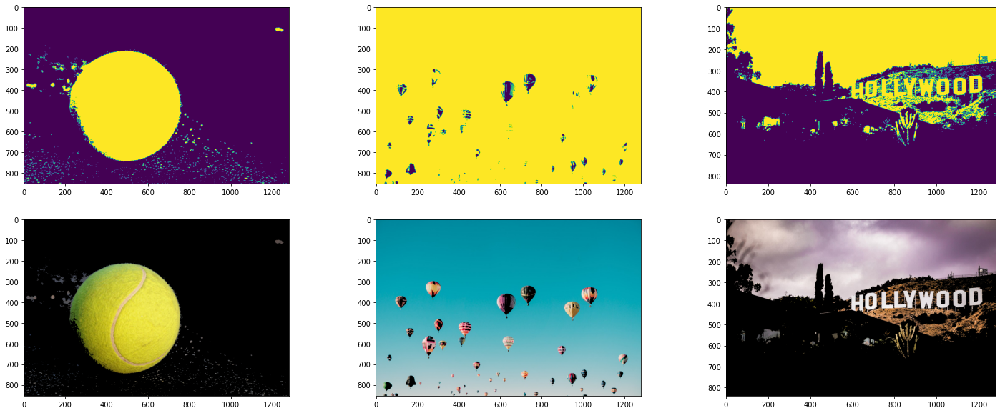

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(25, 10))

for i, img in enumerate(imgs):
  (T, threshInv) = cv2.threshold(images_gray[img], 75, 255, cv2.THRESH_BINARY)
  ax[0,i].imshow(threshInv)

  masked = cv2.bitwise_and(images_rgb[img], images_rgb[img], mask=threshInv)
  ax[1,i].imshow(masked)

### Mасштабування зображення

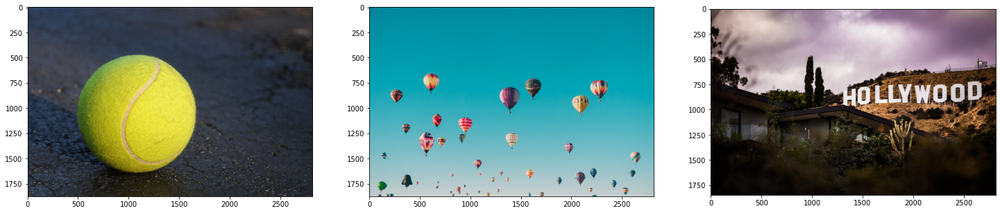

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(25, 10))

for i, img in enumerate(imgs):

  scale_percent = 220 
  width = int(images_rgb[img].shape[1] * scale_percent / 100)
  height = int(images_rgb[img].shape[0] * scale_percent / 100)
  dim = (width, height)

  resized = cv2.resize(images_rgb[img], dim, interpolation = cv2.INTER_AREA)
  ax[i].imshow(resized)

### Афінне перетворення

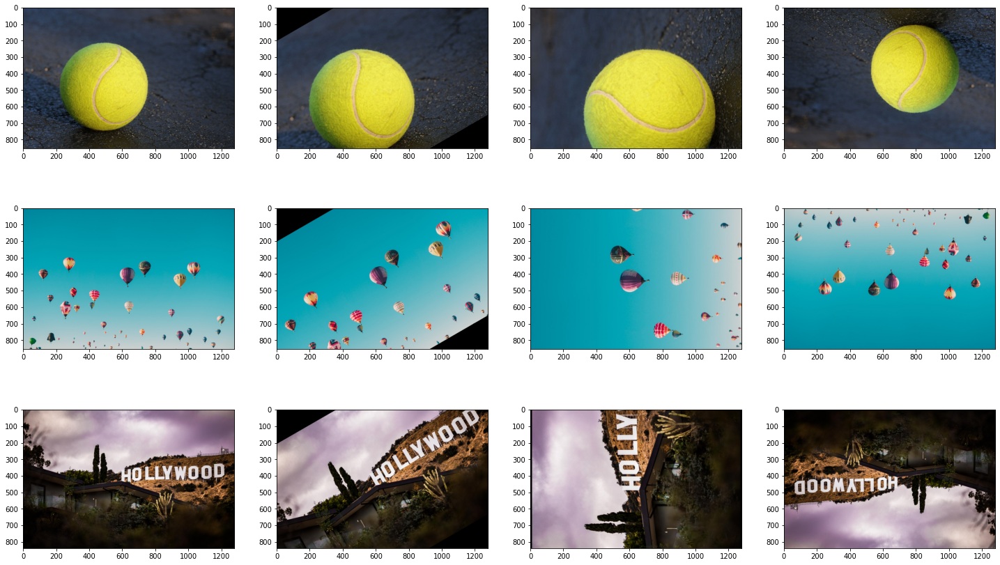

In [ ]:
fig, ax = plt.subplots(3, 4, figsize=(25, 15))

for i, img in enumerate(imgs):
  width, height = images_rgb[img].shape[:2]
  M30 = cv2.getRotationMatrix2D((height/2, width/2), 30, 1.2) 
  M90 = cv2.getRotationMatrix2D((height/2, width/2), 90, 1.5) 
  M180 = cv2.getRotationMatrix2D((height/2, width/2), 180, 1) 

  img_rot30 = cv2.warpAffine(images_rgb[img], M30, (height, width)) 
  img_rot90 = cv2.warpAffine(images_rgb[img], M90, (height, width)) 
  img_rot180 = cv2.warpAffine(images_rgb[img], M180, (height, width)) 

  ax[i, 0].imshow(images_rgb[img]) 
  ax[i, 1].imshow(img_rot30)
  ax[i, 2].imshow(img_rot90)
  ax[i, 3].imshow(img_rot180)

### Морфологічні операції

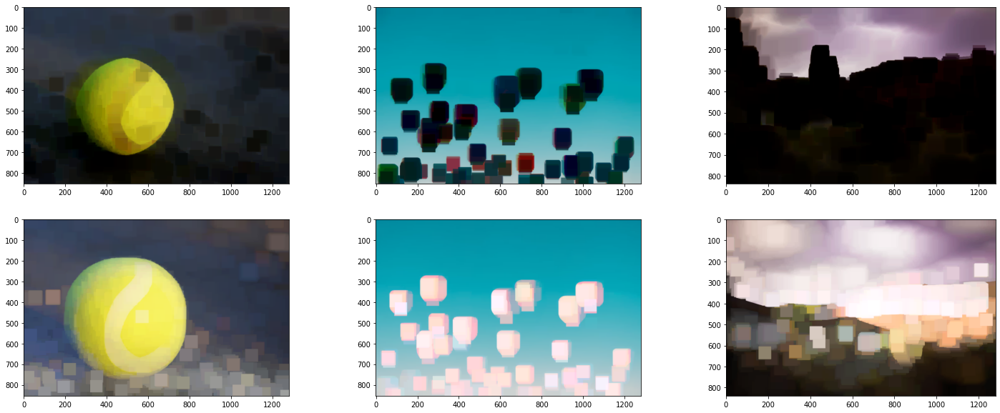

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(25, 10))

for i, img in enumerate(imgs):
  rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (30,30))

  erosion = cv2.erode(images_rgb[img], rect_kernel, iterations=2)
  dilation = cv2.dilate(images_rgb[img], rect_kernel, iterations=2)

  ax[0, i].imshow(erosion)
  ax[1, i].imshow(dilation)

застосуємо інший розмір ядра

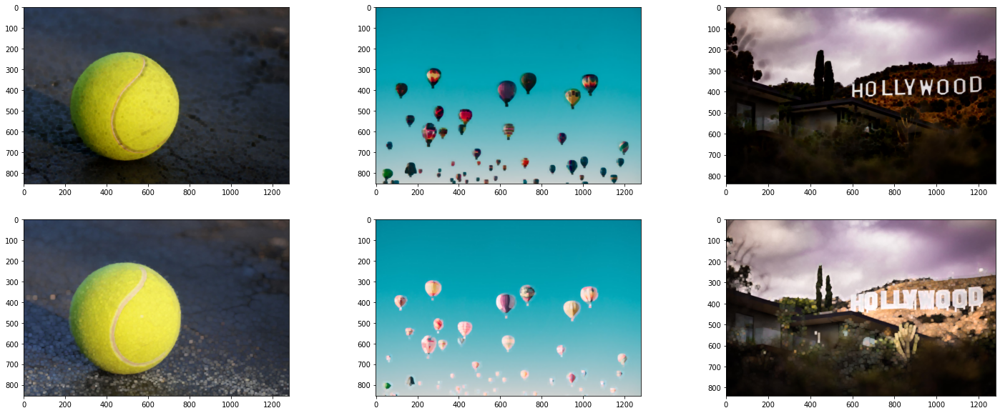

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(25, 10))

for i, img in enumerate(imgs):
  rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))

  erosion = cv2.erode(images_rgb[img], rect_kernel, iterations=2)
  dilation = cv2.dilate(images_rgb[img], rect_kernel, iterations=2)

  ax[0, i].imshow(erosion)
  ax[1, i].imshow(dilation)

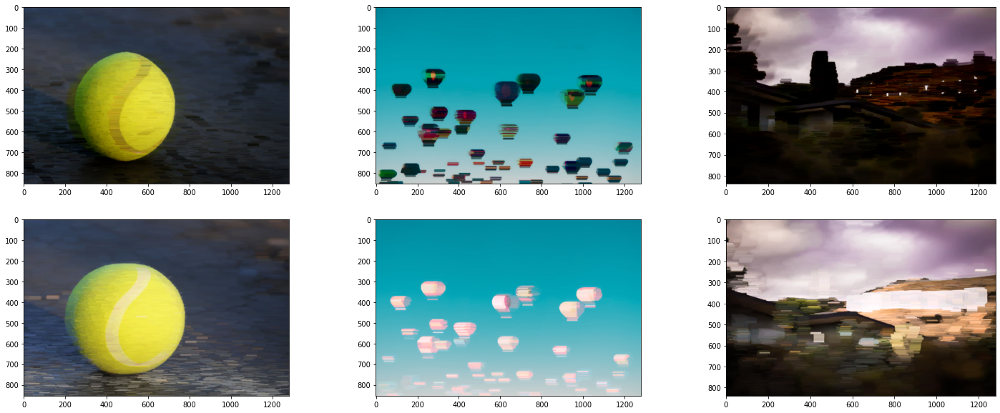

In [ ]:
fig, ax = plt.subplots(2, 3, figsize=(25, 10))

for i, img in enumerate(imgs):
  rect_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25,2))

  erosion = cv2.erode(images_rgb[img], rect_kernel, iterations=2)
  dilation = cv2.dilate(images_rgb[img], rect_kernel, iterations=2)

  ax[0, i].imshow(erosion)
  ax[1, i].imshow(dilation)

При застосуванні дилаціїї та ерозії помітили, що розмір ядра має важливе значення. Так при значенні (30,30) втрачається багато важливих деталей, які ще видно при ядрі (5,5), а також звернемо увагу на зображення тенісного м'яча, який є меншим при ерозії та більшим при делаціїї, а ось при використання прямокутного ядра об'єкт став вужчим при ерозії та ширшим при делації. 

### DoG

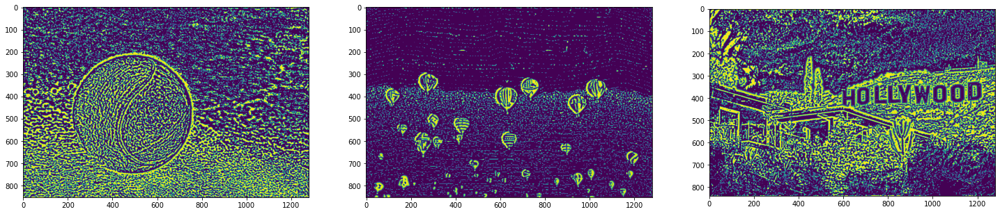

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(25, 10))

for i, img in enumerate(imgs):

  low_sigma = cv2.GaussianBlur(images_gray[img],(7, 7),0)
  high_sigma = cv2.GaussianBlur(images_gray[img],(21,21),0)

  dog = low_sigma - high_sigma
  ax[i].imshow(dog)

### LoG

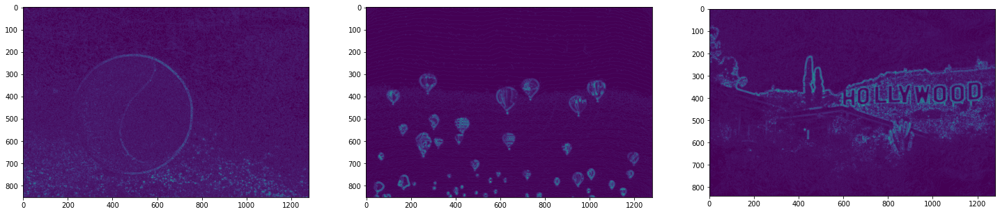

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(25, 10))

for i, img in enumerate(imgs):

  blur = cv2.GaussianBlur(images_gray[img],(9, 9),0)
  laplacian = cv2.Laplacian(blur, cv2.CV_64F)
  log = cv2.convertScaleAbs(laplacian)
  ax[i].imshow(log)

Отже, під час даної лабораторної роботи було проведено порівняння методів обробки зображень.

Розмиття Гасом це розмиття зображення за допомогою функції Гауса. Зазвичай використовується для зменшення шуму зображення та зменшення деталей. Візуальний ефект цієї техніки розмиття — це плавне розмиття, що нагадує перегляд зображення через напівпрозорий екран створюваного розфокусованим об’єктивом.

Гаусове згладжування також використовується як етап попередньої обробки в алгоритмах комп’ютерного зору , щоб покращити структуру зображення в різних масштабах. На прикладі даної лабораторної роботи стало відомо, що розмиття Гаусом використовується для знаходження країв об'єктів в DoG та LoG просторах. 

Піраміда зображень та маштабування використовується для отримання потрібного розміру зображення.

Морфологічні операції як ерозія та розширення мають широкий спектр використання, а саме:
- Видалення шуму
- Виділення окремих елементів і об'єднання різнорідних елементів в зображення.
- Виявлення нерівностей інтенсивності або дірок на зображенні

Афінне перетворення зображення можна використовувати для аугментації даних.